# Explore Wordclouds

In [192]:
from sqlitedict import SqliteDict
db = SqliteDict("Hansard.sqlite")

# Get some speeches from the database

In [193]:
list(db.keys())

['25165', '10505', '24910']

In [310]:
data = db[10505]
speeches = data['speeches']

In [311]:
data['info']['full_name']

'Laurence Robertson'

In [312]:
from collections import Counter
from nltk.stem import WordNetLemmatizer
import re
from wordcloud import STOPWORDS
import matplotlib.pyplot as plt
from wordcloud import WordCloud
stopwords = set(STOPWORDS)
STOPWORDS.add('(b)')
STOPWORDS.add('(a)')
STOPWORDS.add('(c)')

## Count words. Lemmatize. Remove stop words

In [313]:
import string
from nltk.stem import WordNetLemmatizer
import re
def preprocess_speeches(speeches):
    #Concatinates the speeches into one string of text
    text = '\n'.join(speeches)
    #Removes all punctuation
    text = text.translate(str.maketrans('', '', string.punctuation))
    #Removes text inside parenthesis
    text = re.sub(r'\d+', '', text)
    #Converts text into lowercase, and splits by whitespace
    words = text.lower().split()
    words = [w for w in words if len(w) > 1]
    lemmatizer = WordNetLemmatizer()
    #Reduce each word to its root
    words = [lemmatizer.lemmatize(w, pos='v') for w in words]
    return words

In [314]:
from collections import Counter
def frequency_count(words, stopwords = []):
    words_counter = Counter([w for w in words if not w in stopwords])
    return words_counter

In [315]:
extra_stopwords = ['','b', 'will','ask','make','use', 'state','secretary','hon','members','minister','take','say','many','point','statement','go','(a)','may','great','give','one','years','people','right','member','government','house','need','much','friend','come','()','now','mean','reduce','agree','us','(c)','mr','word','want','tell','end','whether','two','£','%','see','gentleman','put','long','yet']
stopwords = set(STOPWORDS)
new_stopwords = stopwords.copy()
for w in extra_stopwords:
    new_stopwords.add(w)

In [316]:
from wordcloud import STOPWORDS
word_freqs = frequency_count(preprocess_speeches(speeches), stopwords=new_stopwords)

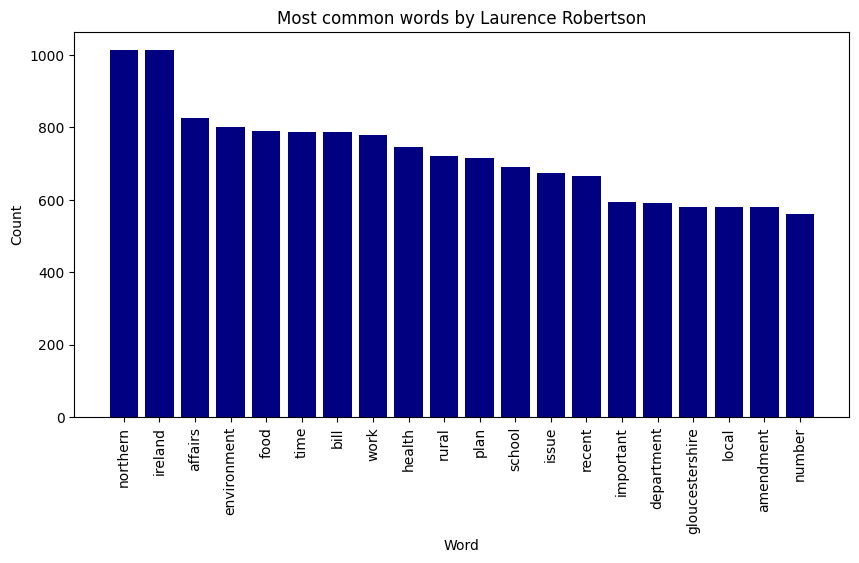

In [317]:
import matplotlib.pyplot as plt
i = data['info']['full_name']
x = [w[0] for w in word_freqs.most_common(20)]
y = [w[1] for w in word_freqs.most_common(20)]
fig = plt.figure(figsize=(10, 5))
colors = ['navy']
plt.bar(x, y, color = colors)
plt.xticks(rotation='vertical')
plt.xlabel('Word')
plt.ylabel('Count')
plt.title(f'Most common words by {i}')
plt.show()

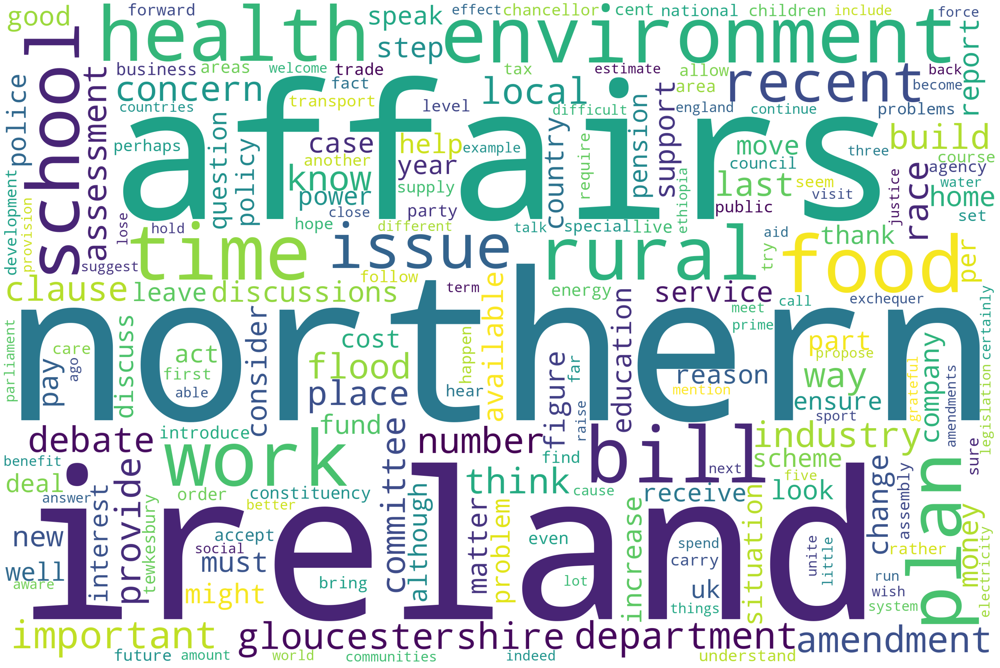

In [318]:
wordcloud = WordCloud()
wordcloud = WordCloud(width = 3000, height = 2000,background_color='white')
wordcloud.generate_from_frequencies({x[0] : x[1] for x in word_freqs.most_common(250)})
plt.figure(figsize=(40, 30))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()


In [1]:
from nltk.util import ngrams
def preprocess_speeches(speeches, bigrams=True):
    #Concatenates the speeches into one string of text
    text = '\n'.join(speeches)
    #Removes all punctuation
    text = text.translate(str.maketrans('', '', string.punctuation))
    #Removes text inside parenthesis
    text = re.sub(r'\d+', '', text)
    #Converts text into lowercase, and splits by whitespace
    words = text.lower().split()
    words = [w for w in words if len(w) > 1]
    lemmatizer = WordNetLemmatizer()
    #Reduce each word to its root
    words = [lemmatizer.lemmatize(w, pos='v') for w in words]
    if bigrams == False:
        return words
    bigrams = ngrams(words, 2)
    return words, bigrams

In [2]:
words, bigrams = preprocess_speeches(speeches, bigrams = True)

NameError: name 'speeches' is not defined

In [321]:
def bigrams_frequency_count(words, bigrams, stopwords = []):
    #Counts words as before, excluding stopwords
    words_counter = Counter([w for w in words if not w in stopwords])
    #Counts bigrams, excluding any that are in the list of stopwords
    bigrams_counter = Counter([' '.join(w) for w in bigrams if not w[0] in stopwords and not w[1] in stopwords])
    #Gets a dictionary of the 250 most common words
    words_counter = words_counter.most_common(250)
    words_counter = {w[0] : w[1] for w in words_counter}
    #Gets a dictionary with the 250 most common bigrams
    bigrams_counter = bigrams_counter.most_common(250)
    bigrams_counter = {w[0] : w[1] for w in bigrams_counter}
    #Removes counts from single words, if they appear in the list of bigrams
    for w in words_counter.keys():
        for b in bigrams_counter.keys():
            bg = b.split()
            if w == bg[0] or w == bg[1]:
                words_counter[w] -= bigrams_counter[b]
    return Counter(words_counter) + Counter(bigrams_counter)

In [322]:
words, bigrams = preprocess_speeches(speeches, bigrams = True)
bigrams = list(bigrams)
freqs = bigrams_frequency_count(words, bigrams, stopwords=new_stopwords)

In [323]:
wordcloud = WordCloud()
wordcloud = WordCloud(width = 3000, height = 2000,background_color='white')
wordcloud.generate_from_frequencies({x[0] : x[1] for x in freqs.most_common(250)})

In [324]:
[x for x in freqs.keys() if 'energy' in x]

['energy',
 'business energy',
 'british energy',
 'renewable energy',
 'energy supply']

In [325]:
[b for b in bigrams if 'energy' in b]

[('business', 'energy'),
 ('energy', 'and'),
 ('business', 'energy'),
 ('energy', 'and'),
 ('business', 'energy'),
 ('energy', 'and'),
 ('business', 'energy'),
 ('energy', 'and'),
 ('business', 'energy'),
 ('energy', 'and'),
 ('business', 'energy'),
 ('energy', 'and'),
 ('business', 'energy'),
 ('energy', 'and'),
 ('through', 'energy'),
 ('energy', 'cost'),
 ('renewable', 'energy'),
 ('energy', 'project'),
 ('business', 'energy'),
 ('energy', 'and'),
 ('consumers', 'energy'),
 ('energy', 'bill'),
 ('business', 'energy'),
 ('energy', 'or'),
 ('domestic', 'energy'),
 ('energy', 'bill'),
 ('and', 'energy'),
 ('energy', 'bill'),
 ('business', 'energy'),
 ('energy', 'and'),
 ('in', 'energy'),
 ('energy', 'which'),
 ('business', 'energy'),
 ('energy', 'and'),
 ('renewable', 'energy'),
 ('energy', 'but'),
 ('business', 'energy'),
 ('energy', 'and'),
 ('business', 'energy'),
 ('energy', 'and'),
 ('business', 'energy'),
 ('energy', 'and'),
 ('business', 'energy'),
 ('energy', 'and'),
 ('busines

In [326]:
list(bigrams)

[('appreciate', 'that'),
 ('that', 'the'),
 ('the', 'foreign'),
 ('foreign', 'commonwealth'),
 ('commonwealth', 'and'),
 ('and', 'development'),
 ('development', 'office'),
 ('office', 'be'),
 ('be', 'the'),
 ('the', 'lead'),
 ('lead', 'on'),
 ('on', 'this'),
 ('this', 'matter'),
 ('matter', 'but'),
 ('but', 'can'),
 ('can', 'the'),
 ('the', 'secretary'),
 ('secretary', 'of'),
 ('of', 'state'),
 ('state', 'give'),
 ('give', 'us'),
 ('us', 'any'),
 ('any', 'idea'),
 ('idea', 'of'),
 ('of', 'the'),
 ('the', 'timescale'),
 ('timescale', 'for'),
 ('for', 'when'),
 ('when', 'he'),
 ('he', 'might'),
 ('might', 'expect'),
 ('expect', 'to'),
 ('to', 'conclude'),
 ('conclude', 'discussions'),
 ('discussions', 'with'),
 ('with', 'the'),
 ('the', 'european'),
 ('european', 'union'),
 ('union', 'and'),
 ('and', 'at'),
 ('at', 'which'),
 ('which', 'point'),
 ('point', 'he'),
 ('he', 'might'),
 ('might', 'consider'),
 ('consider', 'get'),
 ('get', 'the'),
 ('the', 'northern'),
 ('northern', 'ireland

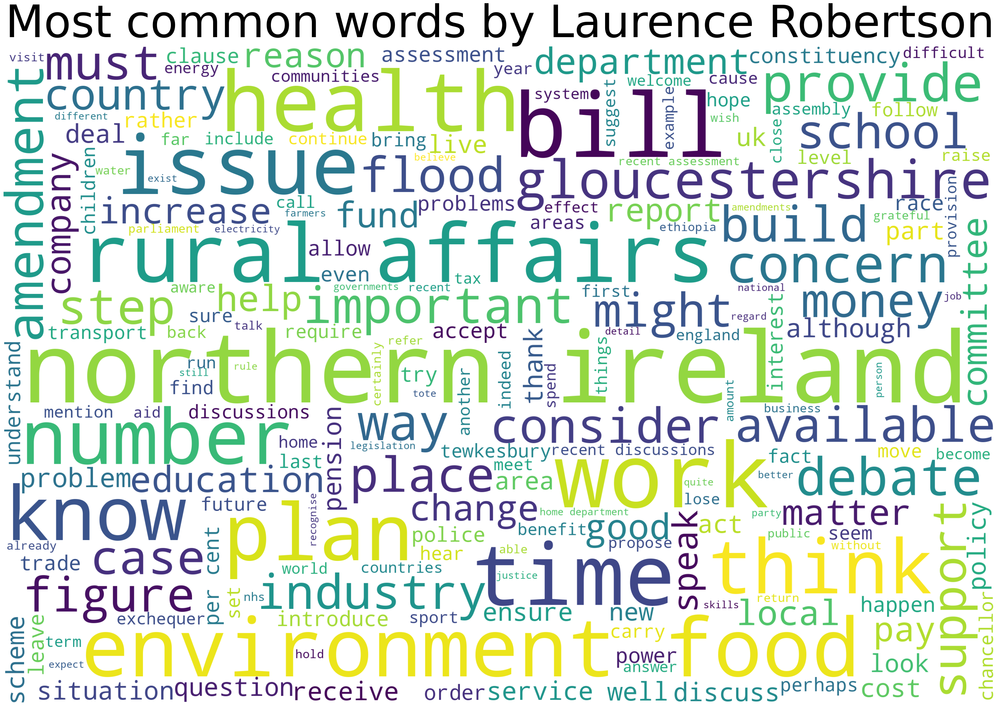

In [327]:
i = data['info']['full_name']
plt.figure(figsize=(40, 30))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title(f'Most common words by {i}', fontdict={'fontsize': 100})
plt.show()

In [295]:
print(words[:20])


['uk', 'to', 'ask', 'the', 'secretary', 'of', 'state', 'for', 'foreign', 'commonwealth', 'and', 'development', 'affairs', 'at', 'what', 'stage', 'under', 'the', 'acrs', 'pathway']


In [205]:
import string
text = '\n'.join(speeches)
text = text.translate(str.maketrans('', '', string.punctuation))
words = text.lower().split()
#words = [re.sub("[.,!?:;-='...'@#_]", " ", s) for s in words]
words = [re.sub(r'\d+', '', w) for w in words]
words = [word.strip() for word in words if word not in stopwords]
words.remove('')
lemmatiser = WordNetLemmatizer()
lem_words = [lemmatiser.lemmatize(w, pos='v') for w in words]
words_counter = Counter(lem_words)

## Basic wordcloud

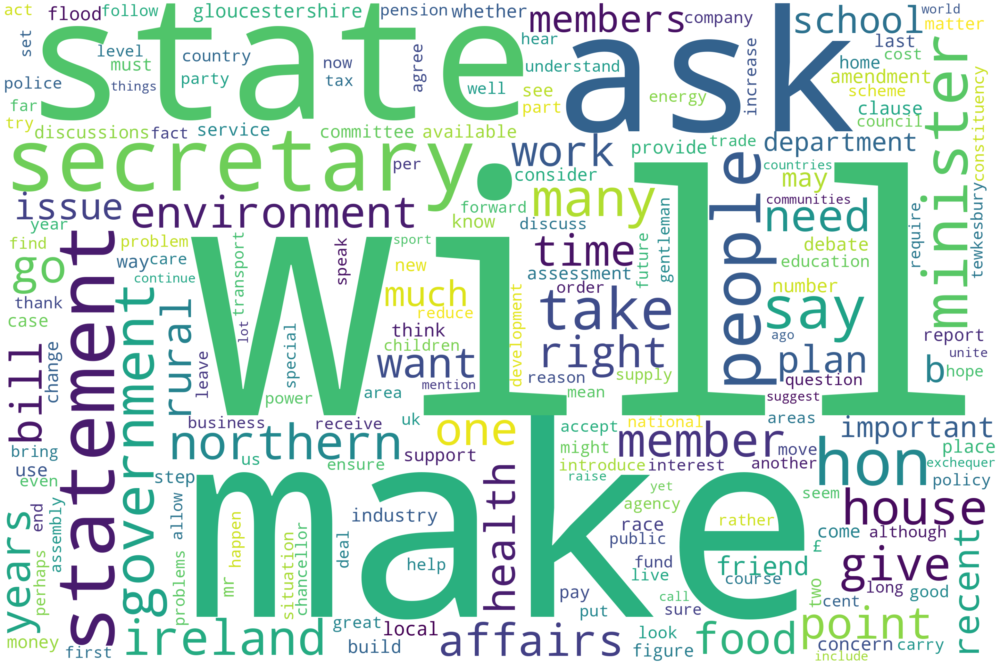

In [206]:
wordcloud = WordCloud()
wordcloud = WordCloud(width = 3000, height = 2000,background_color='white')
wordcloud.generate_from_frequencies({x[0] : x[1] for x in words_counter.most_common(250)})
plt.figure(figsize=(40, 30))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [207]:
extra_stopwords = ['','b', 'will','ask','make','use', 'state','secretary','hon','members','minister','take','say','many','point','statement','go','(a)','may','great','give','one','years','people','right','member','government','house','need','much','friend','come','()','now','mean','reduce','agree','us','(c)','mr','word','want','tell','end','whether','two','£','%','see','gentleman','put','long','yet']
new_stopwords = stopwords.copy()
for w in extra_stopwords:
    new_stopwords.add(w)

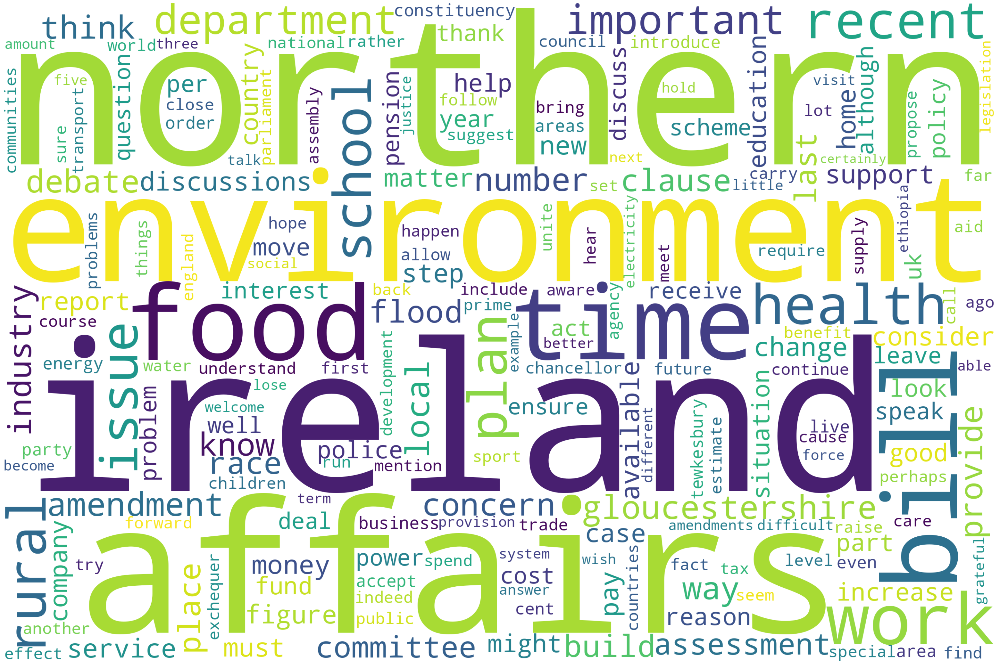

In [208]:
wordcloud = WordCloud()
wordcloud = WordCloud(width = 3000, height = 2000,background_color='white')
word_freqs = {x[0] : x[1] for x in words_counter.most_common(250) if not x[0] in new_stopwords}
wordcloud.generate_from_frequencies(word_freqs)
plt.figure(figsize=(40, 30))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

## BIGRAMS

In [36]:
from nltk.util import ngrams
bigrams_counter = Counter(ngrams(text.lower().split(),2))
trigrams_counter = Counter(ngrams(text.lower().split(),3))

In [37]:
bigrams_freqs = {x[0] : x[1] for x in bigrams_counter.most_common(250) if not x[0][0][-1] == ',' and not x[0][0] in new_stopwords and not x[0][1] in new_stopwords} 
trigrams_freqs = {x[0] : x[1] for x in trigrams_counter.most_common(250) if not x[0][0][-1] == ',' and not x[0][0] in new_stopwords and not x[0][1] in new_stopwords and not x[0][2] in new_stopwords} 

In [38]:
bigrams_freqs = {' '.join(x) :bigrams_freqs[x] for x in bigrams_freqs}
freqs = {**word_freqs, **bigrams_freqs}

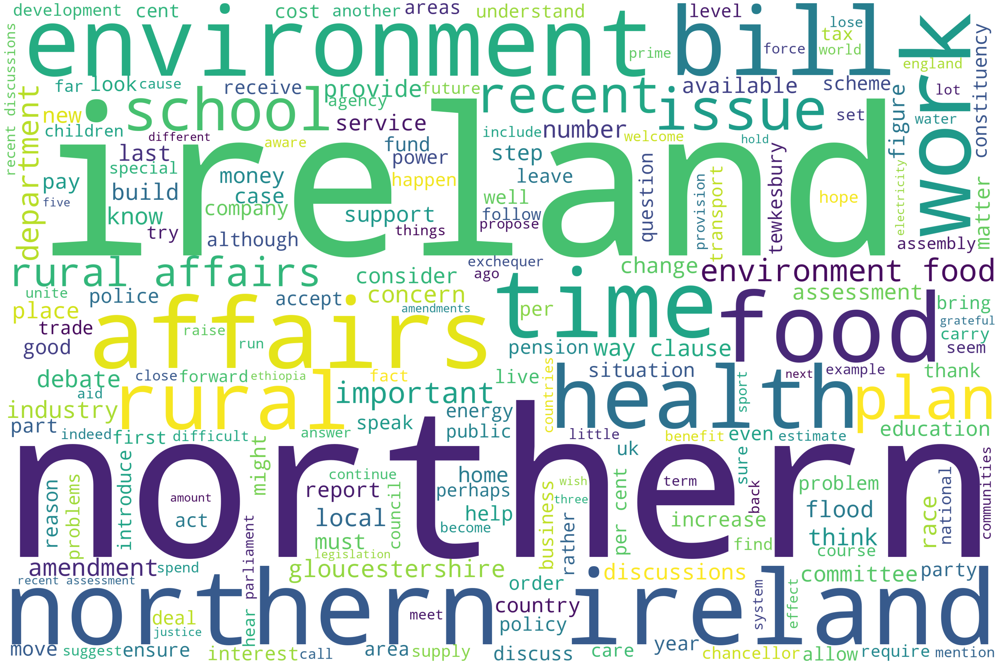

In [39]:
wordcloud = WordCloud()
wordcloud = WordCloud(width = 3000, height = 2000,background_color='white')
wordcloud.generate_from_frequencies(freqs)
plt.figure(figsize=(40, 30))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

## TODO
1.   Write a brief description of the 3 MPs you have chosen for this example and why
1.   Write functions the take as input _speeches_ and return as output _freqs_ which we then feed into the wordcloud program
1.   Demonstrate the impact of adding stopwords. Explain how parliamentary language requires different stopwords
1.   Demonstrate the impact of using bigrams

In [40]:
modified_word_freqs = word_freqs.copy()
for w in modified_word_freqs.keys():
    for bg in bigrams_freqs.keys():
        if w in bg.split():
            modified_word_freqs[w] -= bigrams_freqs[bg]


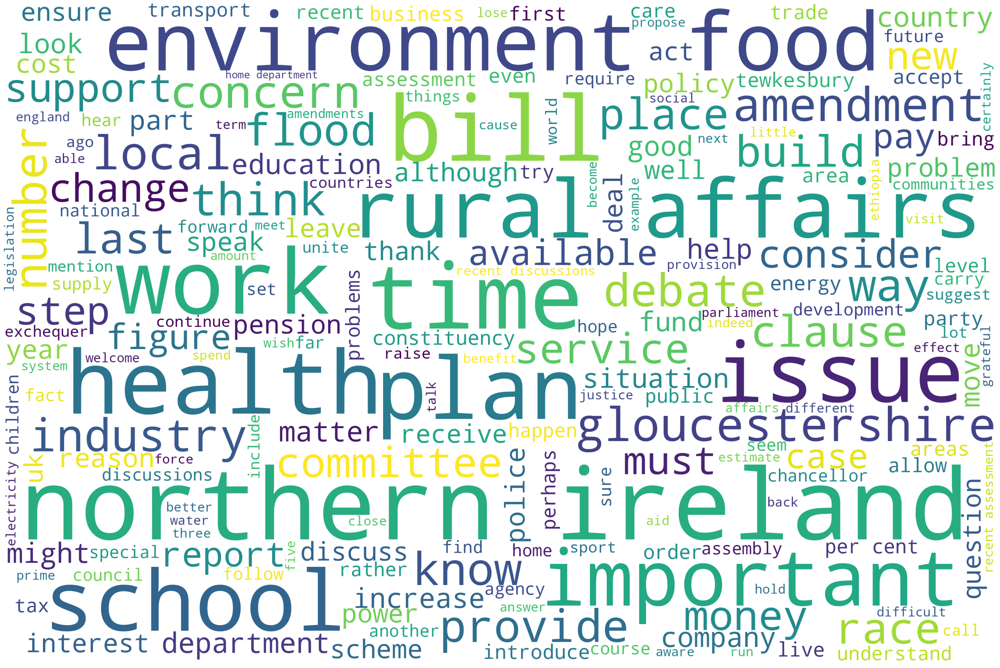

In [41]:
freqs = {**modified_word_freqs, **bigrams_freqs}
wordcloud = WordCloud()
wordcloud = WordCloud(width = 3000, height = 2000,background_color='white')
wordcloud.generate_from_frequencies(freqs)
plt.figure(figsize=(40, 30))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()